<a href="https://colab.research.google.com/github/FarahMourad/Streo-Vision/blob/main/Assignment3_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import cv2          
import numpy as np 
from google.colab import files
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tqdm import tqdm
from numpy.core.memmap import uint8

In [ ]:
def create_dir(dir_name):
  path = '/content/{}'.format(dir_name)
  if not os.path.exists(path):
    os.mkdir(path)
    return True
  return False

In [ ]:
def upload_file(dist_path):
  uploaded = files.upload()
  for img_name, img_content in uploaded.items():
    open('{}/{}'.format(dist_path, img_name), 'wb').write(img_content)
    os.remove(img_name)
  return list(uploaded.keys())

##Load video files

In [ ]:
create_dir('test')
test_data = upload_file('test')
print(test_data)

Saving car2.npy to car2.npy
Saving landing.npy to landing.npy
['car2.npy', 'landing.npy']


##Car detection

In [ ]:
car = np.load('/content/test/car2.npy')
print(car.shape)

(240, 320, 415)


In [ ]:
def crop(img, rect):
  return img[rect[1]:rect[3], rect[0]:rect[2]]

In [ ]:
def get_descents(rect, grad_x, grad_y):
    steepest_descents = []
    for i in range(rect[1],rect[3]):
      for j in range(rect[0],rect[2]):
        delta = np.array([grad_x[i][j], grad_y[i][j]])
        jacobian_mat = np.array([[j,0,i,0,1,0],[0,j,0,i,0,1]])
        mat = np.matmul(delta, jacobian_mat)
        steepest_descents.append(mat)
    
    return steepest_descents

In [ ]:
def LucasKanade_car(img, template, rect, rect_w, rect_h, p, threshold, max_iter=100):   
    d_p_norm = np.inf 
    rows, cols = template.shape
    
    p_prev = p
    iter = 0
    warp_mat = 0

    grad_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
    grad_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)

    while (d_p_norm >= threshold) and iter <= max_iter:
        warp_mat = np.array([[1+p_prev[0], p_prev[2], p_prev[4]], [p_prev[1], 1+p_prev[3], p_prev[5]]])

        rect_top_left = np.array([[rect[0]],[rect[1]],[1]])
        updated_rect_top_left = np.dot(warp_mat, rect_top_left)
        top_left_x, top_left_y = max(0, updated_rect_top_left[0][0]), max(0, updated_rect_top_left[1][0]);
        bottom_right_x, bottom_right_y = min(img.shape[1], top_left_x+rect_w), min(img.shape[0], top_left_y+rect_h);
        updated_rect = [int(top_left_x), int(top_left_y), int(bottom_right_x), int(bottom_right_y)]
        
        img_warped = cv2.warpAffine(img,warp_mat,dsize=(img.shape[1],img.shape[0]))
        curr_frame_cropped = crop(img_warped, updated_rect)
        curr_frame_cropped_h, curr_frame_cropped_w = curr_frame_cropped.shape
              
        diff = crop(template, [0,0,curr_frame_cropped_w,curr_frame_cropped_h]).astype(int) - curr_frame_cropped.astype(int)
        
        steepest_descents = get_descents(updated_rect, grad_x, grad_y)
        Hessian = np.matmul(np.transpose(np.array(steepest_descents)),np.array(steepest_descents))
        Hessian_inv = np.linalg.pinv(Hessian)

        delta_P = np.matmul(np.matmul(Hessian_inv,np.transpose(np.array(steepest_descents))),diff.reshape(((diff.shape[0]*diff.shape[1]),1)))

        p_prev += delta_P.reshape((-1))
        d_p_norm = np.linalg.norm(delta_P)

        iter += 1
    
    rect_top_left = np.array([[rect[0]],[rect[1]],[1]])
    updated_rect_top_left = np.dot(warp_mat, rect_top_left)
    top_left_x, top_left_y = max(0, updated_rect_top_left[0][0]), max(0, updated_rect_top_left[1][0]);

    rect_bottom_right = np.array([[rect[2]],[rect[3]],[1]])
    updated_rect_bottom_right = np.dot(warp_mat, rect_bottom_right)
    warped_bottom_right_x, warped_bottom_right_y = min(img.shape[1], updated_rect_bottom_right[0][0]), min(img.shape[0], updated_rect_bottom_right[1][0]);

    bottom_right_x, bottom_right_y = min(img.shape[1], top_left_x+rect_w), min(img.shape[0], top_left_y+rect_h);

    return p_prev, top_left_x, top_left_y, bottom_right_x, bottom_right_y

In [ ]:
h, w = car[:,:,0].shape
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('result_car.mp4', fourcc, 25.0, (w, h))
first_frame = car[:,:,1]
template = first_frame[109:109+53, 49:49+108]

rect_w = 108
rect_h = 53
rect = [49, 109, 49+rect_w, 109+rect_h]

for i in tqdm(range(car.shape[2])):
  p = np.zeros(6)
  curr_frame = car[:,:,i].copy()
  p, top_left_x, top_left_y, bottom_right_x, bottom_right_y = LucasKanade_car(curr_frame, template, rect, rect_w, rect_h, p, 0.001, 200)

  rect = [int(top_left_x), int(top_left_y), int(bottom_right_x), int(bottom_right_y)]

  output_frame = cv2.rectangle(curr_frame,(int(top_left_x),int(top_left_y)), (int(bottom_right_x), int(bottom_right_y)), (0, 0, 0), 2)
  output_frame = cv2.cvtColor(output_frame,cv2.COLOR_GRAY2RGB)
  out.write(output_frame)

out.release()

100%|██████████| 415/415 [1:17:42<00:00, 11.23s/it]


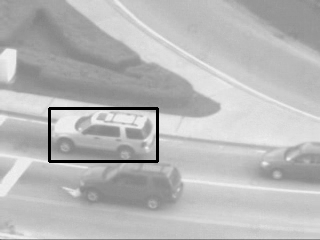

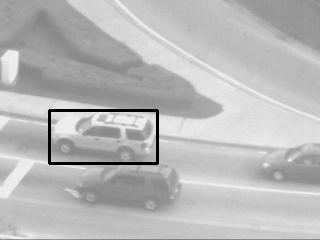

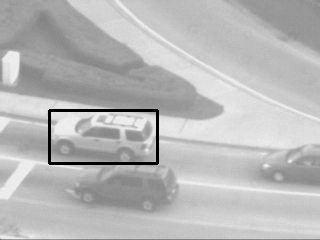

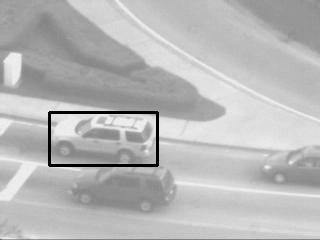

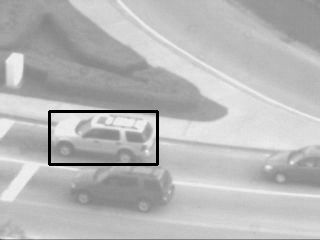

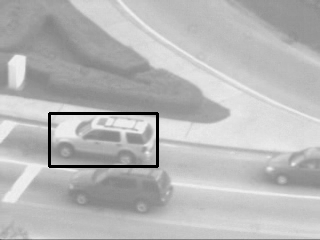

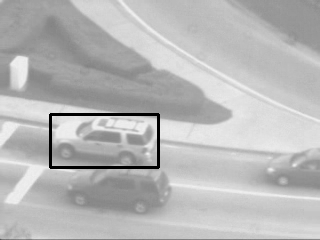

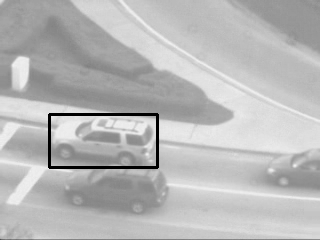

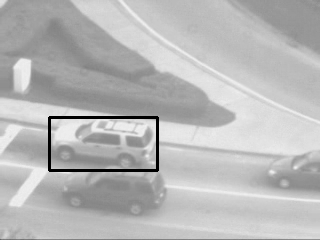

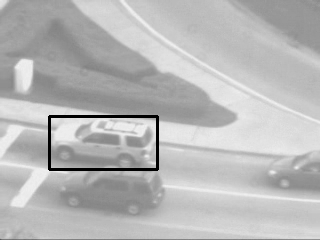

In [ ]:
h, w = car[:,:,0].shape
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('result_car.mp4', fourcc, 25.0, (w, h))
first_frame = car[:,:,1]
template = first_frame[109:109+53, 49:49+108]

rect_w = 108
rect_h = 53
rect = [49, 109, 49+rect_w, 109+rect_h]

for i in range(10):
  p = np.zeros(6)
  curr_frame = car[:,:,i].copy()
  p, top_left_x, top_left_y, bottom_right_x, bottom_right_y = LucasKanade_car(curr_frame, template, rect, rect_w, rect_h, p, 0.001, 200)

  rect = [int(top_left_x), int(top_left_y), int(bottom_right_x), int(bottom_right_y)]

  output_frame = cv2.rectangle(curr_frame,(int(top_left_x),int(top_left_y)), (int(bottom_right_x), int(bottom_right_y)), (0, 0, 0), 2)
  output_frame = cv2.cvtColor(output_frame,cv2.COLOR_GRAY2RGB)
  cv2_imshow(output_frame)

##Helicopter video

In [ ]:
helicopter = np.load('/content/test/landing.npy')
print(helicopter.shape)

(1000, 1100, 50)


In [ ]:
def get_jacobian(x_shape, y_shape):
    x = np.array(range(x_shape))
    y = np.array(range(y_shape))
    x, y = np.meshgrid(x, y) 
    ones = np.ones((y_shape, x_shape))
    zeros = np.zeros((y_shape, x_shape))

    row1 = np.stack((x, zeros, y, zeros, ones, zeros), axis=2)
    row2 = np.stack((zeros, x, zeros, y, zeros, ones), axis=2)
    jacobian = np.stack((row1, row2), axis=2)

    return jacobian

In [ ]:
def LucasKanade_helicopter(img, template, rect, p, threshold, max_iter=100):   
    d_p_norm = np.inf 
    template_h, template_w = template.shape
    
    p_prev = p
    iter = 0
    warp_mat = 0
    while (d_p_norm >= threshold) and iter <= max_iter:
        warp_mat = np.array([[1+p_prev[0], p_prev[2], p_prev[4]], [p_prev[1], 1+p_prev[3], p_prev[5]]])

        rect_top_left = np.array([[rect[0]],[rect[1]],[1]])
        updated_rect_top_left = np.dot(warp_mat, rect_top_left)
        top_left_x, top_left_y = max(0, updated_rect_top_left[0][0]), max(0, updated_rect_top_left[1][0]);

        rect_bottom_right = np.array([[rect[2]],[rect[3]],[1]])
        updated_rect_bottom_right = np.dot(warp_mat, rect_bottom_right)
        bottom_right_x, bottom_right_y = min(img.shape[1], updated_rect_bottom_right[0][0]), min(img.shape[0], updated_rect_bottom_right[1][0]);
        
        updated_rect = [int(top_left_x), int(top_left_y), int(bottom_right_x), int(bottom_right_y)]
        
        curr_frame_cropped = crop(img, updated_rect)
        curr_frame_cropped_h, curr_frame_cropped_w = curr_frame_cropped.shape

        diff = template.astype(int) - cv2.resize(curr_frame_cropped, (template_w, template_h)).astype(int)

        grad_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
        grad_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)
        
        grad_x_cropped = cv2.resize(crop(grad_x, updated_rect),(template_w, template_h))
        grad_y_cropped = cv2.resize(crop(grad_y, updated_rect),(template_w, template_h))
           
        jacob = get_jacobian(template_w, template_h)
        
        grad = np.stack((grad_x_cropped, grad_y_cropped), axis=2)
        grad = np.expand_dims((grad), axis=2)
        
        steepest_descents = np.matmul(grad, jacob)
        steepest_descents_trans = np.transpose(steepest_descents, (0, 1, 3, 2))
        
        hessian_matrix = np.matmul(steepest_descents_trans, steepest_descents).sum((0,1))
      
        diff = diff.reshape((template_h, template_w, 1, 1))
        update = (steepest_descents_trans * diff).sum((0,1))
        
        d_p = np.matmul(np.linalg.pinv(hessian_matrix), update).reshape((-1))
            
        p_prev += d_p
        
        d_p_norm = np.linalg.norm(d_p)
        iter += 1
    
    rect_top_left = np.array([[rect[0]],[rect[1]],[1]])
    updated_rect_top_left = np.dot(warp_mat, rect_top_left)
    top_left_x, top_left_y = max(0, updated_rect_top_left[0][0]), max(0, updated_rect_top_left[1][0]);

    rect_bottom_right = np.array([[rect[2]],[rect[3]],[1]])
    updated_rect_bottom_right = np.dot(warp_mat, rect_bottom_right)
    bottom_right_x, bottom_right_y = min(img.shape[1], updated_rect_bottom_right[0][0]), min(img.shape[0], updated_rect_bottom_right[1][0]);

    return p_prev, top_left_x, top_left_y, bottom_right_x, bottom_right_y

In [ ]:
helicopter_first_frame = helicopter[:,:,0].copy()
helicopter_template = helicopter_first_frame[88:88+42, 433:433+128]
h, w = helicopter[:,:,0].shape
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('result_helicopter.mp4', fourcc, 15.0, (w, h))

rect_w = 128
rect_h = 42
rect = [433, 88, 438+rect_w, 88+rect_h]
p = np.zeros(6)

for i in tqdm(range(helicopter.shape[2])):
  curr_frame = helicopter[:,:,i].copy()
  p, top_left_x, top_left_y, bottom_right_x, bottom_right_y = LucasKanade_helicopter(curr_frame, helicopter_template, rect, p, 0.001, 200)

  output_frame = cv2.rectangle(curr_frame,(int(top_left_x),int(top_left_y)), (int(bottom_right_x), int(bottom_right_y)), (0, 0, 0), 2)
  output_frame = cv2.cvtColor(output_frame, cv2.COLOR_GRAY2RGB)
  out.write(output_frame)

out.release()

100%|██████████| 50/50 [01:24<00:00,  1.69s/it]


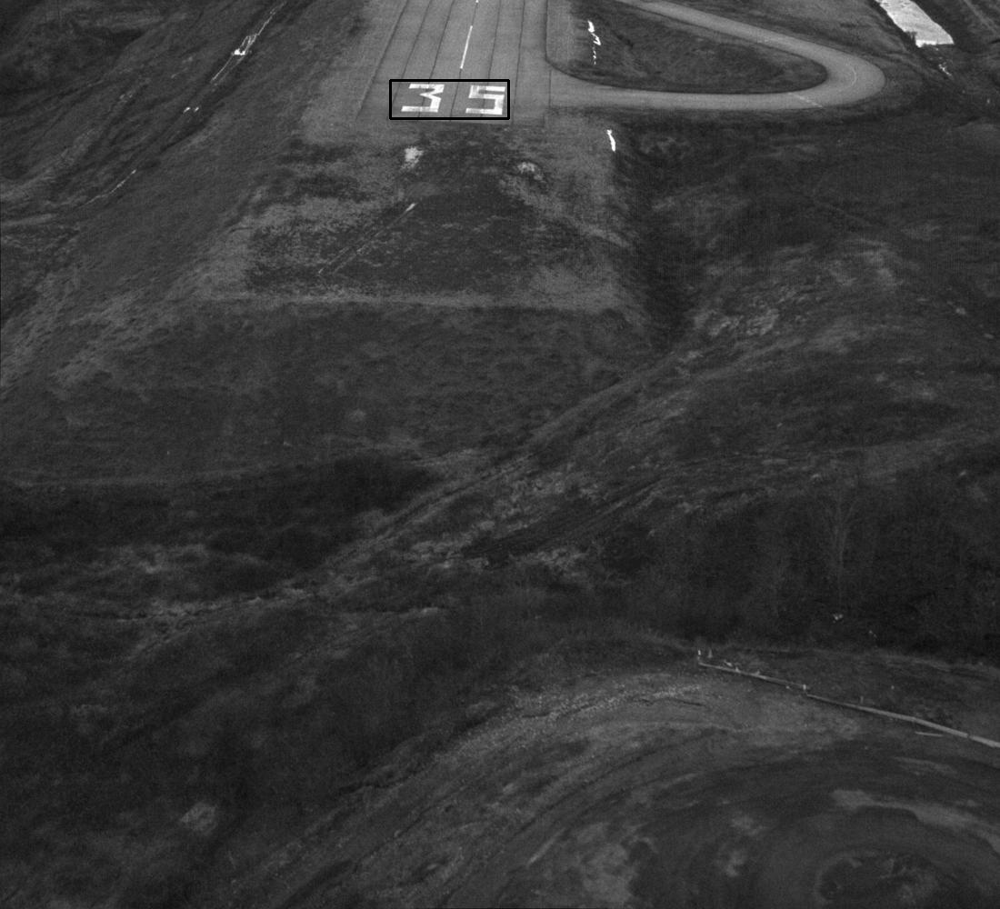

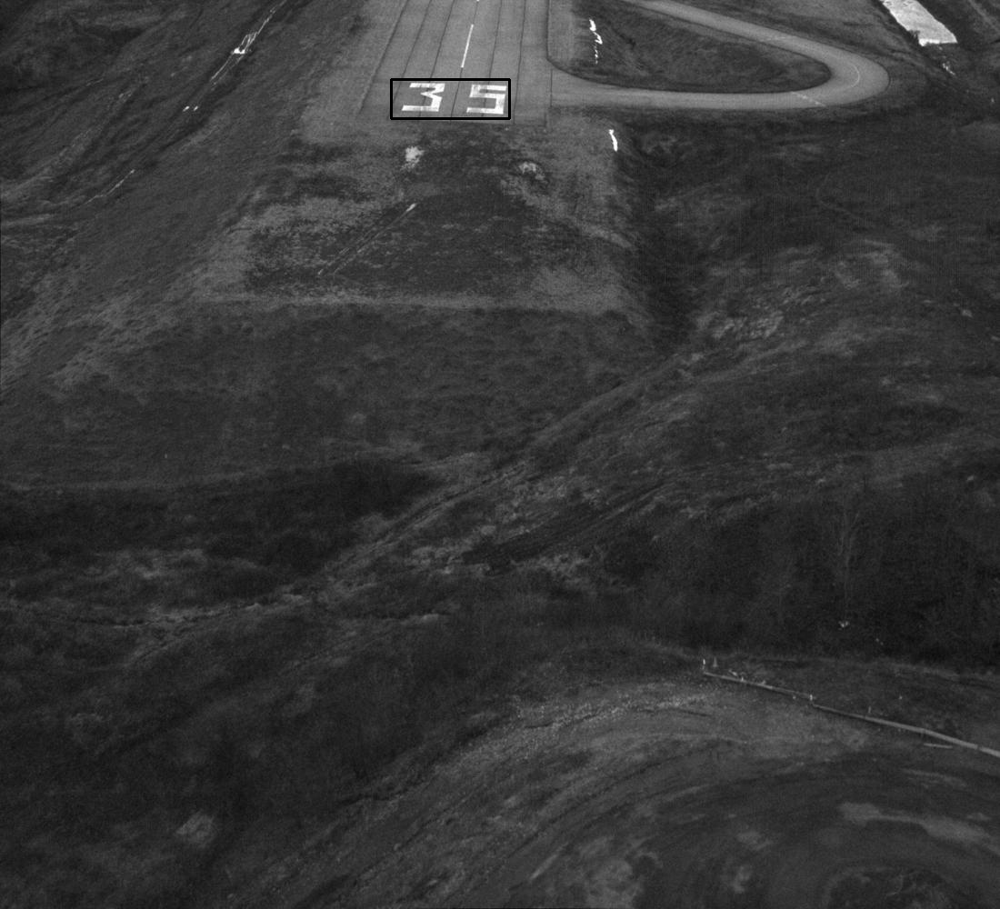

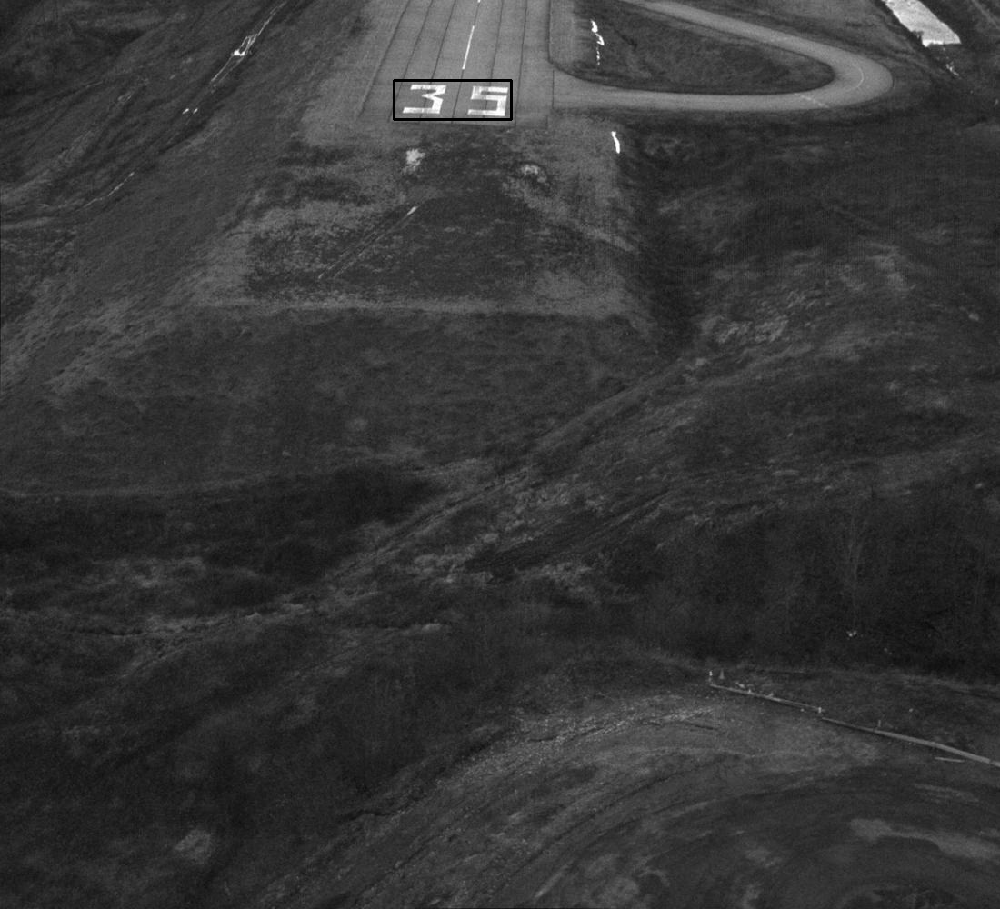

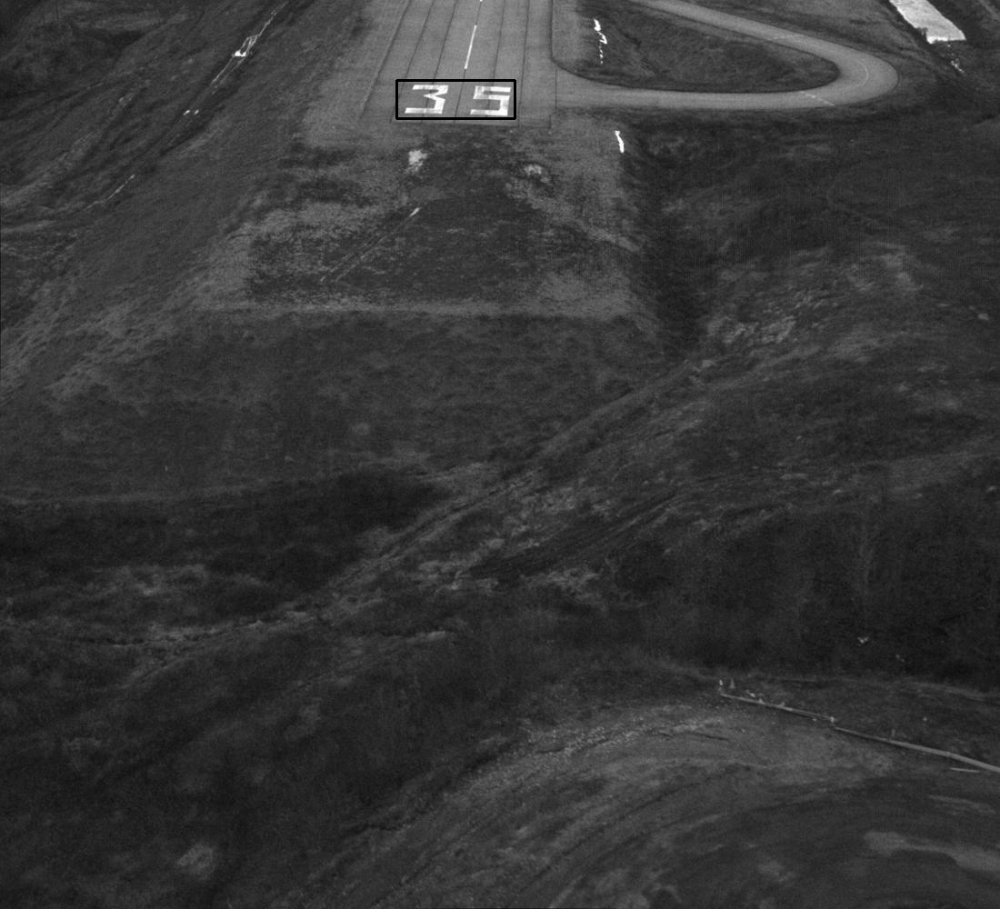

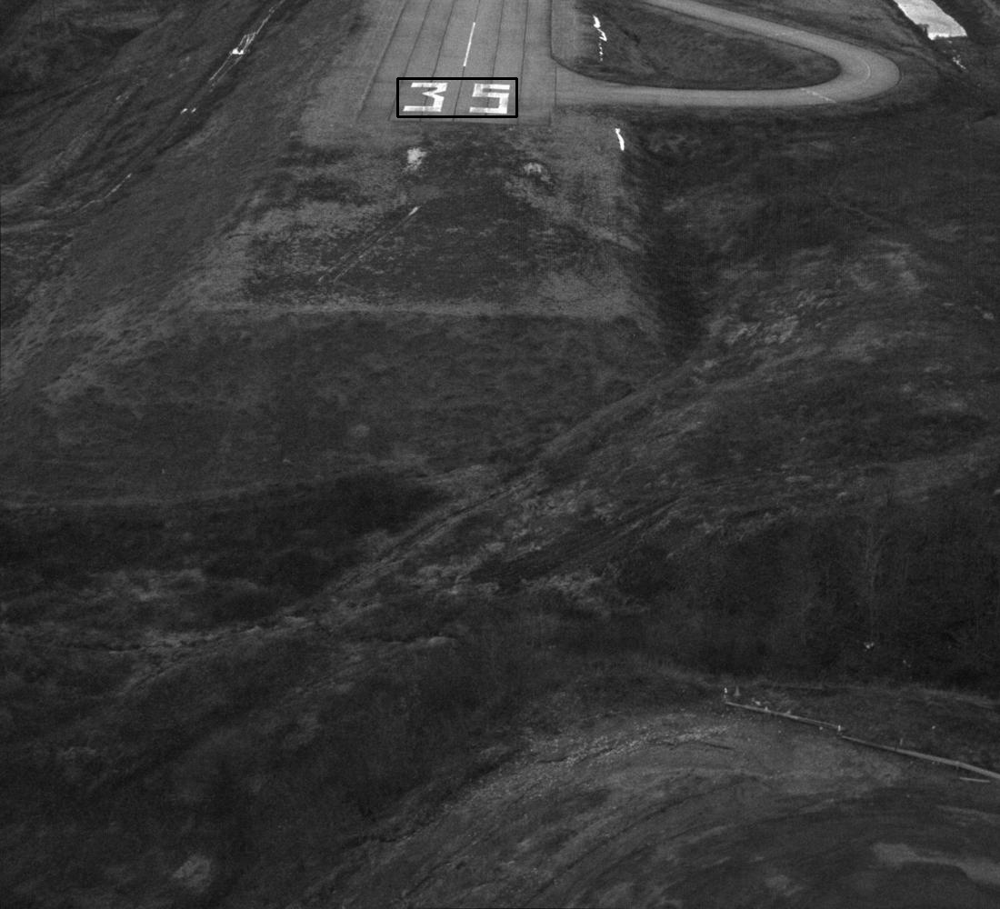

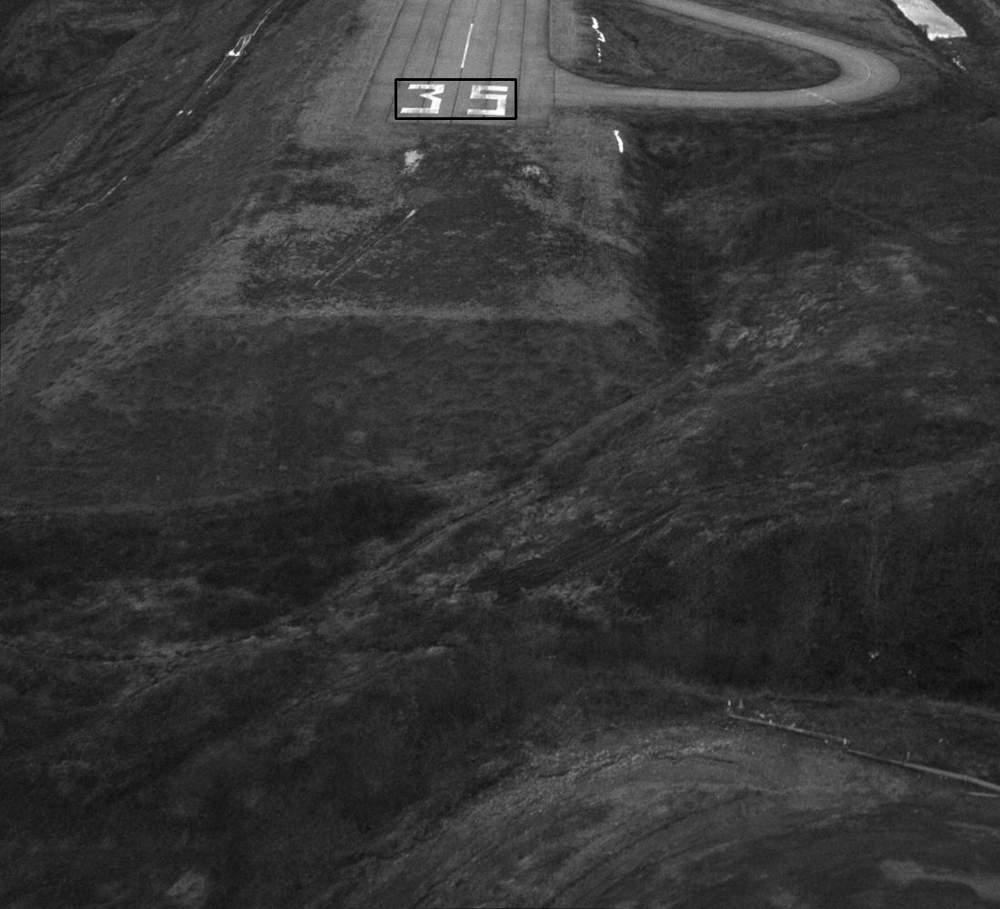

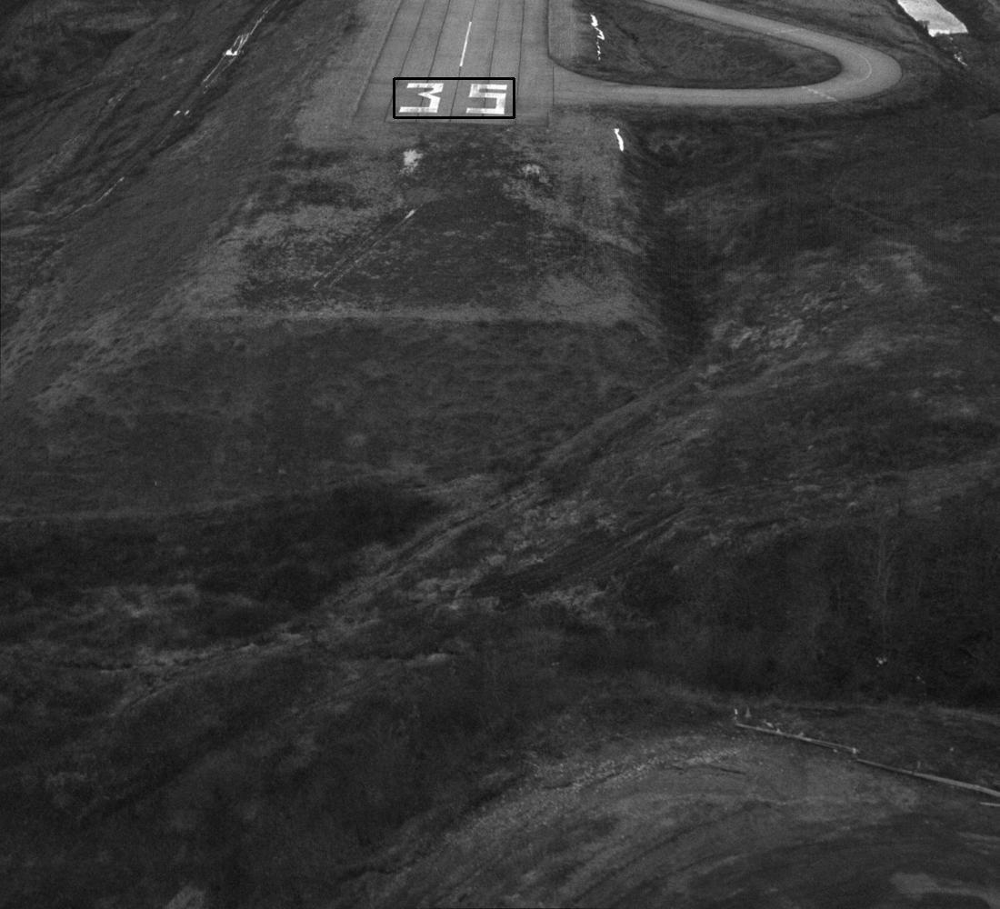

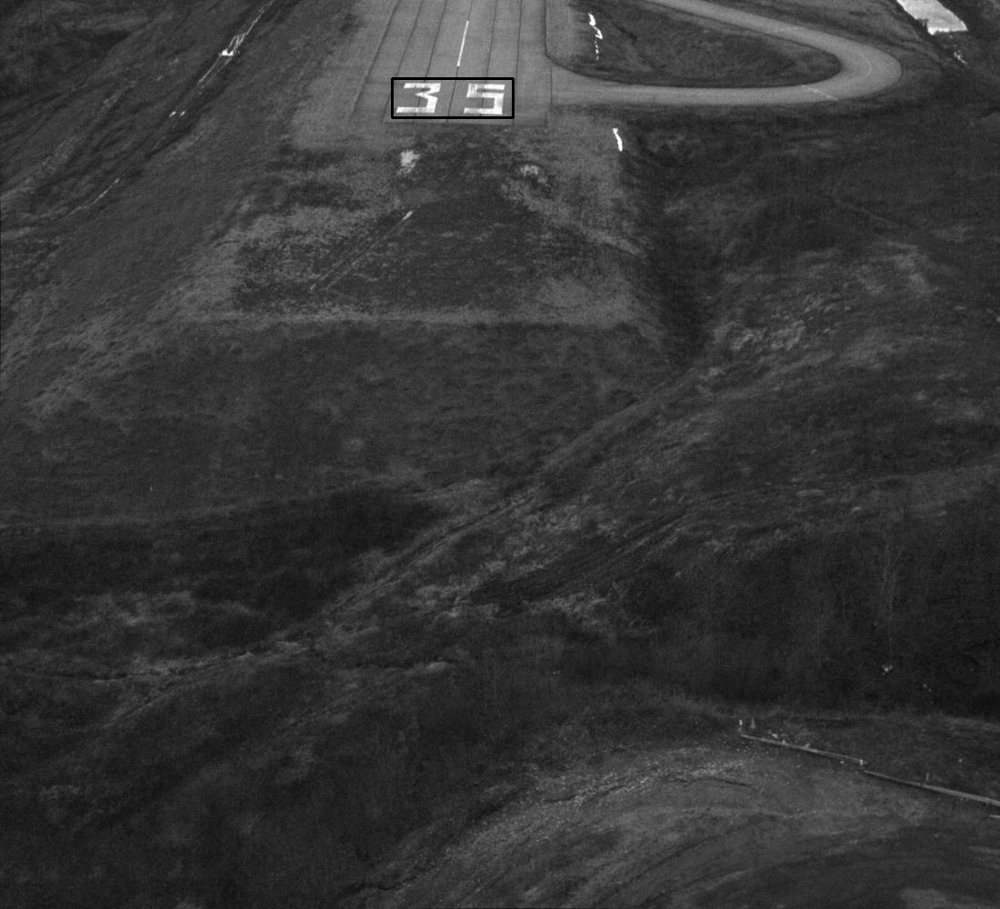

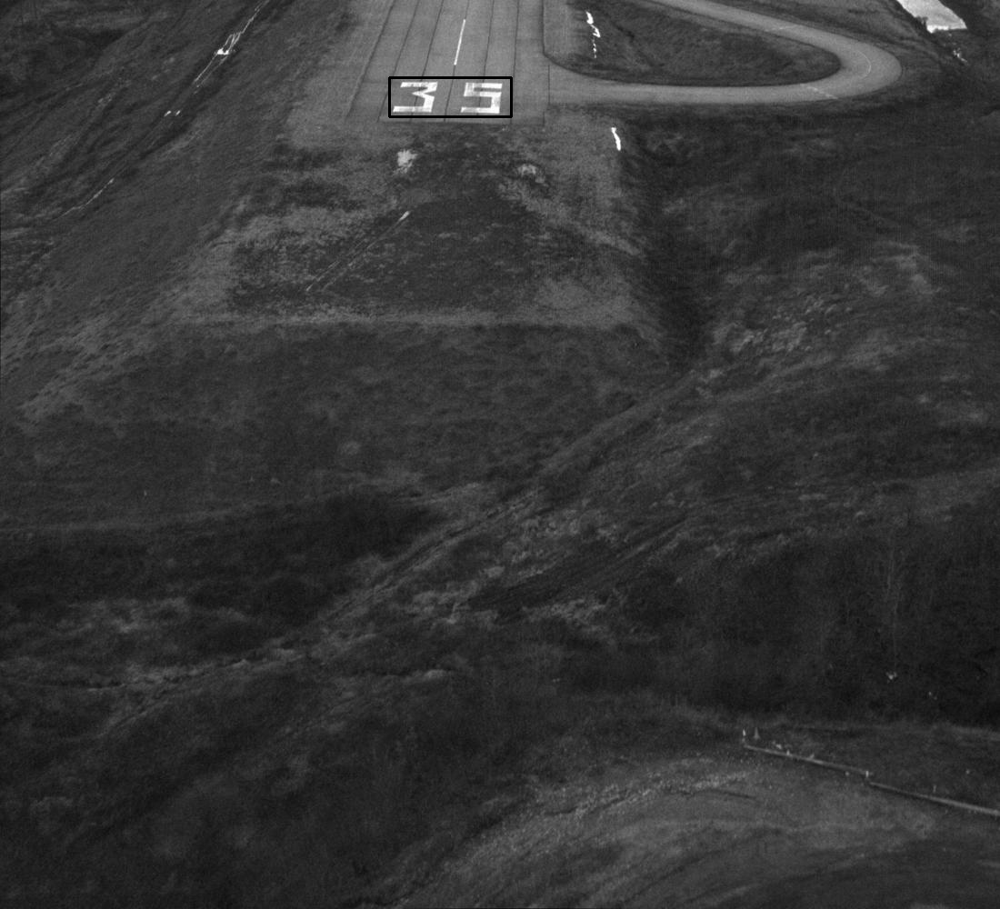

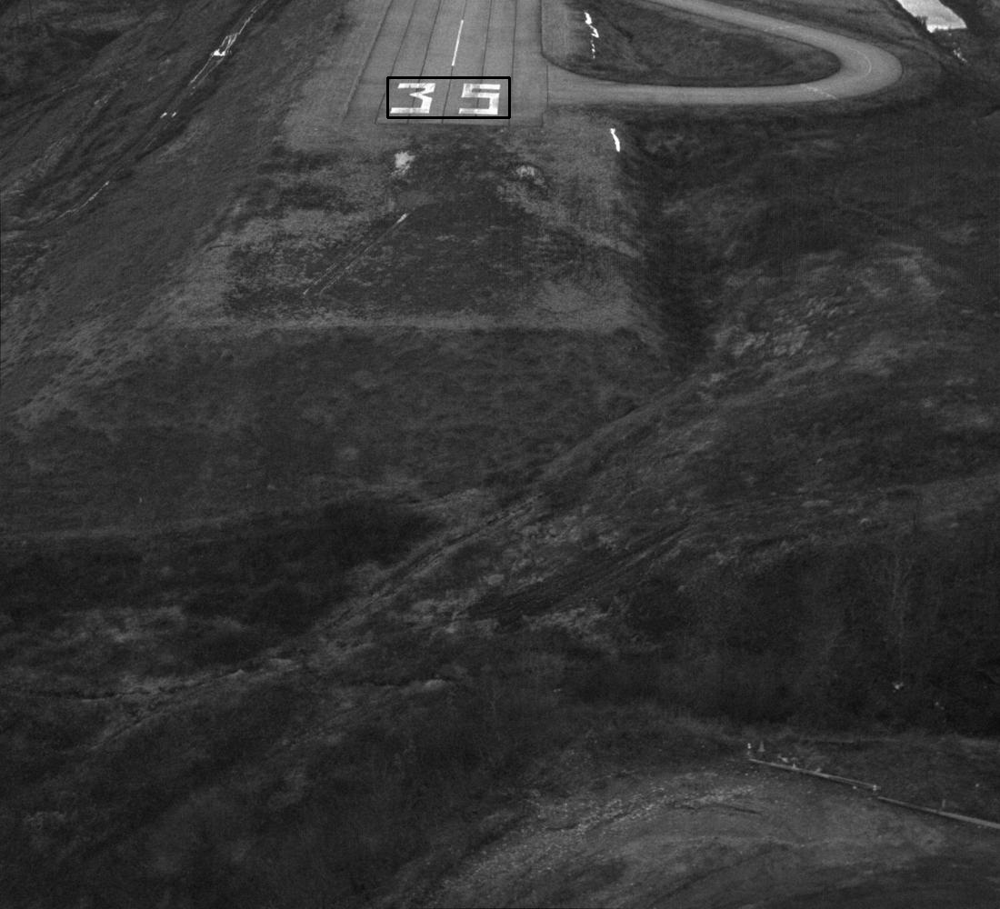

In [ ]:
helicopter_first_frame = helicopter[:,:,0].copy()
helicopter_template = helicopter_first_frame[88:88+42, 433:433+128]
h, w = helicopter[:,:,0].shape
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('result_helicopter.mp4', fourcc, 15.0, (w, h))

rect_w = 128
rect_h = 42
rect = [433, 88, 438+rect_w, 88+rect_h]
p = np.zeros(6)

for i in range(10):
  curr_frame = helicopter[:,:,i].copy()
  p, top_left_x, top_left_y, bottom_right_x, bottom_right_y = LucasKanade_helicopter(curr_frame, helicopter_template, rect, p, 0.001, 200)

  output_frame = cv2.rectangle(curr_frame,(int(top_left_x),int(top_left_y)), (int(bottom_right_x), int(bottom_right_y)), (0, 0, 0), 2)
  output_frame = cv2.cvtColor(output_frame, cv2.COLOR_GRAY2RGB)
  cv2_imshow(output_frame)